# SOFTWARE LAB PROJECT PART I: Analysis of the marine animals trajectory

###### By `Akomoneh Raymond Anumaneh`, Supervised by `Prof. Nikolai Kornev` Univerisity of Rostock

This report is about the Visualization and characterization of marine animal trajectories. The Animals, Seals, were tracked with GPS devices and information relating to their location such as longitude and latitudes over time recorded. Parameters such as trajectories, mean speed, straightness index, Sinuosity and Fractal Dimension are of interest.
Totally, 27 Seals were tracked but this analysis is done on 4 seals (G17, G20, S11, & S12) selected based on tracking duration. Longer durations were of interest because they provided more details and hence more meaningful analysis. 
It is worth mentioning that this report closely follows the work of [1] and most of the Methods and definitions are unedited while the Traja and Trajr documentations were also consulted.
This First part of the Project will focus on cleaning the Data with python and Trajectories will be plotted with Traja

### 1. Data preparation with Python

In [1]:
#Import Pandas and other Libraries 
import pandas as pd
import matplotlib.pyplot as plt 
import numpy as np 
import seaborn as sns

#### Read the first excel file into a Pandas DataFrame called Animals, parse the Dates and set the `D_Date` column as the index of the DataFrame

In [7]:
Animals = pd.read_excel("hg67_gps.xlsx")

Animals.head()

,REF,D_DATE,NSATS_DETECTED,NSATS_TRANSMITTED,LAT,LON,V_MASK
0,hg67-007-19,2019-05-23 10:01:31,5,5,50.250320,1.51882,0
1,hg67-007-19,2019-05-23 10:11:32,9,8,50.252010,1.52456,0
2,hg67-007-19,2019-05-23 10:21:32,9,8,50.252029,1.52456,0
3,hg67-007-19,2019-05-23 10:31:32,9,8,50.251781,1.52576,0
4,hg67-007-19,2019-05-23 10:41:32,8,8,50.250359,1.52450,0


In [8]:
Animals.shape

(102000, 7)

Describing the columns

In [9]:
table = pd.read_excel("Description Table GPS.xlsx")
print(table)

               Champ                                        Explication
0                REF                                         Tag number
1             D_DATE                      Date and time of GPS location
2     NSATS_DETECTED     Number of satellites detected for GPS location
3  NSATS_TRANSMITTED            Number of satellites with transmissions
4                LAT                      Latitude (in decimal degrees)
5                LON                     Longitude (in decimal degrees)
6             V_MASK  Filter based on the required (expected) seal s...


Only three columns: "REF", "LAT" and "LON" will be retained from Animals DataFrame. The rest will be dropped as they are not needed for this Analysis.

Read the second excel file into a Pandas DataFrame called "Seals". This DataFrame contains a description of all the Animals(Seals beingtracked)

In [10]:
seals = pd.read_excel("Seals_tracked_in_2019.xlsx", parse_dates=True)

print(seals.head())

print(seals.shape)

  Date capture Seal    Species   Capture area Sex Body mass (kg)  \
0   2019-05-23  G13  Grey seal  Baie de Somme   M             92   
1   2019-05-23  G14  Grey seal  Baie de Somme   M             60   
2   2019-05-23  G15  Grey seal  Baie de Somme   M             84   
3   2019-05-23  G16  Grey seal  Baie de Somme   M            142   
4   2019-05-24  G17  Grey seal  Baie de Somme   M            108   

   Body Length (cm)  Girth (cm)   Tag number         Start_track  \
0               174         114  hg67-015-19 2019-05-23 09:34:30   
1               132         103  hg67-016-19 2019-05-23 09:07:42   
2               140         111  hg67-007-19 2019-05-23 10:01:31   
3               204         133  hg67-017-19 2019-05-23 11:36:25   
4               165         120  hg67-013-19 2019-05-24 09:05:39   

             End_track  Duration (days)  \
0  2019-10-16 00:03:00       145.603125   
1  2019-11-11 14:35:00       172.227292   
2  2019-10-07 15:21:00       137.221863   
3  2019-07

Subsetting the Animals DataFrame to keep only the needed columns. The DataFrame will be renamed `Animals_df`

In [11]:
Animals_df = Animals[["REF", "LAT", "LON"]]

Animals_df.head()

,REF,LAT,LON
0,hg67-007-19,50.250320,1.51882
1,hg67-007-19,50.252010,1.52456
2,hg67-007-19,50.252029,1.52456
3,hg67-007-19,50.251781,1.52576
4,hg67-007-19,50.250359,1.52450


In [12]:
Animals_df.shape

(102000, 3)

Subsetting the Seals DataFrame to keep only the needed columns. The DataFrame will be renamed `Animals_species`

In [13]:
Animals_species = pd.read_excel("Grey_and_Harbour_Seals.xlsx")

Animals_species.head()

,Seal,Species,Duration (days)
0,G13,Grey seal,145.603125
1,G14,Grey seal,172.227292
2,G15,Grey seal,137.221863
3,G16,Grey seal,43.444491
4,G17,Grey seal,179.578715


In [14]:
Animals_species.shape

(27, 3)

### How many different Species of Seals?

In [15]:
Animals_species.groupby('Species')['Seal'].count()

Species
Grey seal       12
Harbour seal    15
Name: Seal, dtype: int64

So, there are two major types of Species: `Grey Seals` and `Harbour Seals`. Grey seals are named begining with `G` for example `G13` while Harbour seals are named begining with `S` for example `S11`.

Selecting two Grey Seals and two Harbour Seals for the Analysis

In [16]:
G17 = (Animals_df['REF'] == 'hg67-013-19')  

G20 = (Animals_df['REF'] == 'hg67-024-19')

S11 = (Animals_df['REF'] == 'hg67-025-19')

S12 = (Animals_df['REF'] == 'hg67-009-19')

In [17]:
Seals_df = Animals_df.loc[G17 | G20 | S11 | S12][["REF", "LAT", "LON"]]
Seals_df.shape

(36569, 3)

In [18]:
Seals_df.head()

,REF,LAT,LON
16998,hg67-009-19,50.184040,1.61893
16999,hg67-009-19,50.183971,1.61840
17000,hg67-009-19,50.183949,1.61816
17001,hg67-009-19,50.183270,1.61725
17002,hg67-009-19,50.192860,1.61410


### How many data points for each seal?

In [19]:
Seals_df.groupby("REF").count()

,LAT,LON
REF,,
hg67-009-19,4645,4645
hg67-013-19,15452,15452
hg67-024-19,13935,13935
hg67-025-19,2537,2537


Replace `REF` Values with Seal name

In [20]:
df = Seals_df.replace(to_replace='hg67-013-19', value='G17', inplace=True)

In [21]:
Seals_df.groupby("REF").count()

,LAT,LON
REF,,
G17,15452,15452
hg67-009-19,4645,4645
hg67-024-19,13935,13935
hg67-025-19,2537,2537


In [22]:
df = Seals_df.replace(to_replace='hg67-024-19', value='G20', inplace=True)
df = Seals_df.replace(to_replace='hg67-025-19', value='S11', inplace=True)
df = Seals_df.replace(to_replace='hg67-009-19', value='S12', inplace=True)

In [23]:
Seals_df.groupby("REF").count()

,LAT,LON
REF,,
G17,15452,15452
G20,13935,13935
S11,2537,2537
S12,4645,4645


In [24]:
Seals_df.head()

,REF,LAT,LON
16998,S12,50.184040,1.61893
16999,S12,50.183971,1.61840
17000,S12,50.183949,1.61816
17001,S12,50.183270,1.61725
17002,S12,50.192860,1.61410


In [25]:
Seals_df.groupby('REF').describe()

LAT                                                                   \
       count       mean       std        min        25%        50%        75%   
REF                                                                             
G17  15452.0  51.151629  0.557788  50.211029  50.596902  51.009275  51.760592   
G20  13935.0  52.507366  1.723454  49.291771  50.378904  53.441952  54.122175   
S11   2537.0  50.301005  0.094535  50.183949  50.246090  50.252499  50.328838   
S12   4645.0  50.146450  0.067054  49.993980  50.083530  50.110050  50.218208   

                    LON                                                  \
           max    count      mean       std      min       25%      50%   
REF                                                                       
G17  51.883869  15452.0  2.425247  0.925651  1.06201  1.547107  1.92314   
G20  54.685989  13935.0  0.667062  0.702587 -0.71895  0.173015  0.29413   
S11  50.661911   2537.0  1.499079  0.050355  1.34721  1.461920  1.51763   
S12  50.243938   4645.0  1.449593  0.073697  1.19851  1.393760  1.41740   

                        
          75%      max  
REF                     
G17  3.367407  3.85782  
G20  1.423460  3.05066  
S11  1.529800  1.61854  
S12  1.523890  1.61893

### Using Seaborn's Countplot() to visualise the distribution of the data

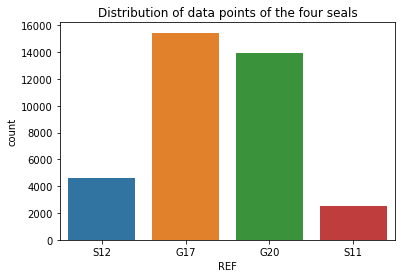

In [26]:
fig = sns.countplot(x="REF", data=Seals_df)
plt.title("Distribution of data points of the four seals")

plt.savefig("Distribution of data points of the four seals")

##### It is clear that there is a bias in the total number of datapoints available for Harbour Seals 

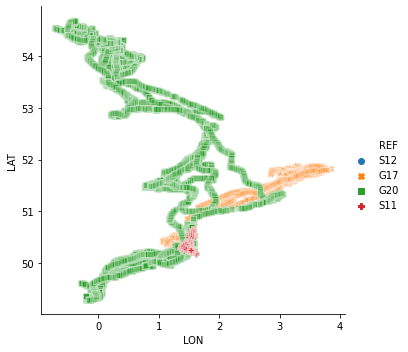

In [27]:
#sns.scatterplot(x='LON', y='LAT', hue='REF', data=Seals_df)
sns.relplot(x="LON", y="LAT", data=Seals_df, kind="scatter", style="REF", hue="REF", alpha=0.3)

### save results in a csv file called "Seals_df"

In [28]:
Seals_df.to_csv("Seals_frame.csv")

Read File into same DataFrame

In [30]:
Seals_df = pd.read_csv("Seals_frame.csv")

In [31]:
Seals_df.head()

,Unnamed: 0,REF,LAT,LON
0,16998,S12,50.184040,1.61893
1,16999,S12,50.183971,1.61840
2,17000,S12,50.183949,1.61816
3,17001,S12,50.183270,1.61725
4,17002,S12,50.192860,1.61410


### Haversine Distance

The haversine formula determines the great-circle distance between two points on a sphere given their longitudes and latitudes.

In [32]:
def Haversine(lat1, lon1, lat2, lon2, to_radians=True, earth_radius=6371):
    """

    Calculate the great circle distance between two points
    on the earth (specified in radians)

    All (lat, lon) coordinates must have numeric dtypes and be of equal length.

    """
    # earth_radius is in km

    a = np.sin((lat2-lat1)/2.0)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin((lon2-lon1)/2.0)**2

    return earth_radius * 2 * np.arcsin(np.sqrt(a))

In [33]:
Seals_df.isna().sum()

Unnamed: 0    0
REF           0
LAT           0
LON           0
dtype: int64

### Get `Seal G17`


In [39]:
Seals_df111 = pd.read_csv("Seals_df111.csv")

Seal_G17 = Seals_df111.loc[Seals_df111["REF"] == "G17"][["D_DATE", "REF", "LAT", "LON", "LATR", "LONR"]]

Seal_G17.head()

,D_DATE,REF,LAT,LON,LATR,LONR
4645,2019-05-24 09:05:39,G17,50.251179,1.51962,0.877049,0.026522
4646,2019-05-24 09:15:40,G17,50.251839,1.52003,0.877060,0.026530
4647,2019-05-24 09:25:40,G17,50.251801,1.52109,0.877059,0.026548
4648,2019-05-24 09:35:44,G17,50.250660,1.52006,0.877039,0.026530
4649,2019-05-24 09:45:54,G17,50.250622,1.51821,0.877039,0.026498


#### Apply `Haversine Distance` formula to `Seal G17` to get the distance between GPS signals

In [40]:
Seal_G17['dist(km)'] = \
    Haversine(Seal_G17.LATR.shift(), Seal_G17.LONR.shift(),
                 Seal_G17.loc[1:, 'LATR'], Seal_G17.loc[1:, 'LONR'])
Seal_G17.head()

,D_DATE,REF,LAT,LON,LATR,LONR,dist(km)
4645,2019-05-24 09:05:39,G17,50.251179,1.51962,0.877049,0.026522,NaN
4646,2019-05-24 09:15:40,G17,50.251839,1.52003,0.877060,0.026530,0.078962
4647,2019-05-24 09:25:40,G17,50.251801,1.52109,0.877059,0.026548,0.075486
4648,2019-05-24 09:35:44,G17,50.250660,1.52006,0.877039,0.026530,0.146456
4649,2019-05-24 09:45:54,G17,50.250622,1.51821,0.877039,0.026498,0.131598


#### Calculate the total Length of the Trajectory in km

In [41]:
#Total Length
Seal_G17["dist(km)"].sum()

7174.437045340494

In [42]:
Seal_G17 = Seal_G17.fillna(0)
Seal_G17.head()

,D_DATE,REF,LAT,LON,LATR,LONR,dist(km)
4645,2019-05-24 09:05:39,G17,50.251179,1.51962,0.877049,0.026522,0.000000
4646,2019-05-24 09:15:40,G17,50.251839,1.52003,0.877060,0.026530,0.078962
4647,2019-05-24 09:25:40,G17,50.251801,1.52109,0.877059,0.026548,0.075486
4648,2019-05-24 09:35:44,G17,50.250660,1.52006,0.877039,0.026530,0.146456
4649,2019-05-24 09:45:54,G17,50.250622,1.51821,0.877039,0.026498,0.131598


#### Calculating time between Signals for `Seal G17`

First convert `D_DATE` column to DataFrame `datetime` object

In [43]:
Seal_G17["D_DATE"] = pd.to_datetime(Seal_G17['D_DATE'])

#### Get time difference between GPS signals in `seconds` and save results in a column called `time`

In [44]:
Seal_G17['time'] = Seal_G17.D_DATE.diff().astype('timedelta64[s]')
Seal_G17.head()

,D_DATE,REF,LAT,LON,LATR,LONR,dist(km),time
4645,2019-05-24 09:05:39,G17,50.251179,1.51962,0.877049,0.026522,0.000000,NaN
4646,2019-05-24 09:15:40,G17,50.251839,1.52003,0.877060,0.026530,0.078962,601.0
4647,2019-05-24 09:25:40,G17,50.251801,1.52109,0.877059,0.026548,0.075486,600.0
4648,2019-05-24 09:35:44,G17,50.250660,1.52006,0.877039,0.026530,0.146456,604.0
4649,2019-05-24 09:45:54,G17,50.250622,1.51821,0.877039,0.026498,0.131598,610.0


#### Convert Results of the time difference to a _`cumulative sum`_ and save the results back in the `time` column

In [45]:
Seal_G17['time'] = Seal_G17['time'].cumsum()
Seal_G17.head()

,D_DATE,REF,LAT,LON,LATR,LONR,dist(km),time
4645,2019-05-24 09:05:39,G17,50.251179,1.51962,0.877049,0.026522,0.000000,NaN
4646,2019-05-24 09:15:40,G17,50.251839,1.52003,0.877060,0.026530,0.078962,601.0
4647,2019-05-24 09:25:40,G17,50.251801,1.52109,0.877059,0.026548,0.075486,1201.0
4648,2019-05-24 09:35:44,G17,50.250660,1.52006,0.877039,0.026530,0.146456,1805.0
4649,2019-05-24 09:45:54,G17,50.250622,1.51821,0.877039,0.026498,0.131598,2415.0


#### Fill NaN values with zero and Select Required Columns and save as csv for Analysis with Trajr in R

In [48]:
Seal_G17 = Seal_G17.fillna(0)
G17_coords = Seal_G17[["LAT", "LON", "time"]]
G17_coords.to_csv("G17_coords")
G17_coords.head()

,LAT,LON,time
4645,50.251179,1.51962,0.0
4646,50.251839,1.52003,601.0
4647,50.251801,1.52109,1201.0
4648,50.250660,1.52006,1805.0
4649,50.250622,1.51821,2415.0


## UTM and Transformation of Coordinates  

The Universal Transverse Mercator (UTM) is a system for assigning coordinates to locations on the surface of the Earth. Like the traditional method of latitude and longitude, it is a horizontal position representation, which means it ignores altitude and treats the earth as a perfect ellipsoid. However, it differs from global latitude/longitude in that it divides earth into 60 zones, each 6° of longitude in width and projects each to the plane as a basis for its coordinates. Specifying a location means specifying the zone and the x, y coordinate in that plane.  
A Bidirectional UTM-WGS84 converter for python by [4] has been used to convert Longitudes and latitudes into the UTM XY coordinates required by both Traja and Trajr. The implementation in python as explained on the GitHub page (see references).

#### Convert `LON` and `LAT` to `UTM XY` cartesian coordinates

In [49]:
#import utm
import utm

In [50]:
#Try a few examlpes
u = utm.from_latlon(47.9941214, 7.8509671)
u

(414278.16730997514, 5316285.595228155, 32, 'T')

In [51]:
print(utm.to_latlon(*u))

(47.994121400319436, 7.8509670217918375)


In [52]:
#Define functions to get X and Y coordinates from utm

def get_X(row):
        return utm.from_latlon(row['LAT'], row['LON'])[0]

def get_Y(row):
        return utm.from_latlon(row['LAT'], row['LON'])[1] 


In [53]:
#get X and Y coordinates and store as new columns in the df

Seal_G17['X'] = Seal_G17.apply(get_X, axis=1)
Seal_G17['Y'] = Seal_G17.apply(get_Y, axis=1)

Seal_G17.head()

,D_DATE,REF,LAT,LON,LATR,LONR,dist(km),time,X,Y
4645,2019-05-24 09:05:39,G17,50.251179,1.51962,0.877049,0.026522,0.000000,0.0,394461.400351,5.567607e+06
4646,2019-05-24 09:15:40,G17,50.251839,1.52003,0.877060,0.026530,0.078962,601.0,394492.091939,5.567680e+06
4647,2019-05-24 09:25:40,G17,50.251801,1.52109,0.877059,0.026548,0.075486,1201.0,394567.573353,5.567674e+06
4648,2019-05-24 09:35:44,G17,50.250660,1.52006,0.877039,0.026530,0.146456,1805.0,394491.621708,5.567549e+06
4649,2019-05-24 09:45:54,G17,50.250622,1.51821,0.877039,0.026498,0.131598,2415.0,394359.659729,5.567547e+06


In [54]:
Seal_G17.to_csv("Seal_G17.csv")

# 2. CREATING TRAJECTORIES


Basically, the trajectory of an animal is the curve described by the animal 
when it moves. The sampling of the trajectory implies a step of discretization, 
that is the division of this continuous curve into a number of discrete “steps” connecting successive relocations of the animal [2]. Two main classes of trajectories can be distinguished: 
•	`Trajectories of type I` are characterized by the fact that the time is 
not precisely known or not taken into account for the relocations of the 
trajectory; 
•	  `Trajectories of type II` are characterized by the fact that time is 
known for each relocation.  
This report follows type II trajectories. 


## 2.1  Creating Trajectories with python package _`Traja`_ 
 
Type II trajectories have been created using python’s traja Library developed by `Justin Shenk` [3]. For the sake of this project, the x and y coordinates will be supplied with Longitudes and Latitudes respectively. Traja requires conversion in to a TrajaDataFrame and also takes a third optional time argument as follows:


In [58]:
Seals_df111 = pd.read_csv("Seals_df111.csv")

Seals_df111.head()

,Unnamed: 0,D_DATE,REF,LAT,LON,LATR,LONR,dist(km),ΔT_min
0,0,2019-05-24 22:33:48,S12,50.184040,1.61893,0.875877,0.028256,NaN,NaN
1,1,2019-05-24 22:43:48,S12,50.183971,1.61840,0.875876,0.028246,0.038501,10.0
2,2,2019-05-24 23:03:48,S12,50.183949,1.61816,0.875875,0.028242,0.017274,20.0
3,3,2019-05-25 03:53:48,S12,50.183270,1.61725,0.875863,0.028226,0.099495,290.0
4,4,2019-05-25 04:53:48,S12,50.192860,1.61410,0.876031,0.028171,1.089702,60.0


#### Get the coordinates of each of the four selected Seals _`G17`_ ,  _`G20`_ ,  _`S11`_ ,  and _`S12`_ into a seperate DataFrame

In [59]:
G17 = Seals_df111.loc[Seals_df111["REF"] == "G17"][["LAT", "LON", "D_DATE"]]

G20 = Seals_df111.loc[Seals_df111["REF"] == "G20"][["LAT", "LON", "D_DATE"]]

S11 = Seals_df111.loc[Seals_df111["REF"] == "S11"][["LAT", "LON", "D_DATE"]]

S12 = Seals_df111.loc[Seals_df111["REF"] == "S12"][["LAT", "LON", "D_DATE"]]

In [60]:
S12.head()

,LAT,LON,D_DATE
0,50.184040,1.61893,2019-05-24 22:33:48
1,50.183971,1.61840,2019-05-24 22:43:48
2,50.183949,1.61816,2019-05-24 23:03:48
3,50.183270,1.61725,2019-05-25 03:53:48
4,50.192860,1.61410,2019-05-25 04:53:48


#### Rename Columns to fit python's Trajectory package _`traja`_

In [61]:
G17 = G17.rename(columns={"LON": "x", "LAT": "y", "D_DATE": "time"}) 

G20 = G20.rename(columns={"LON": "x", "LAT": "y", "D_DATE": "time"}) 

S11 = S11.rename(columns={"LON": "x", "LAT": "y", "D_DATE": "time"}) 

S12 = S12.rename(columns={"LON": "x", "LAT": "y", "D_DATE": "time"}) 

In [62]:
G17.head()

,y,x,time
4645,50.251179,1.51962,2019-05-24 09:05:39
4646,50.251839,1.52003,2019-05-24 09:15:40
4647,50.251801,1.52109,2019-05-24 09:25:40
4648,50.250660,1.52006,2019-05-24 09:35:44
4649,50.250622,1.51821,2019-05-24 09:45:54


#### Plotting the Four Trajectories with _`traja`_

First Transform Seal DataFrame into a `TrajaDataFrame`in each case before plotting

## Trajectory of  <font color=blue>Seal G17</font>

C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWar

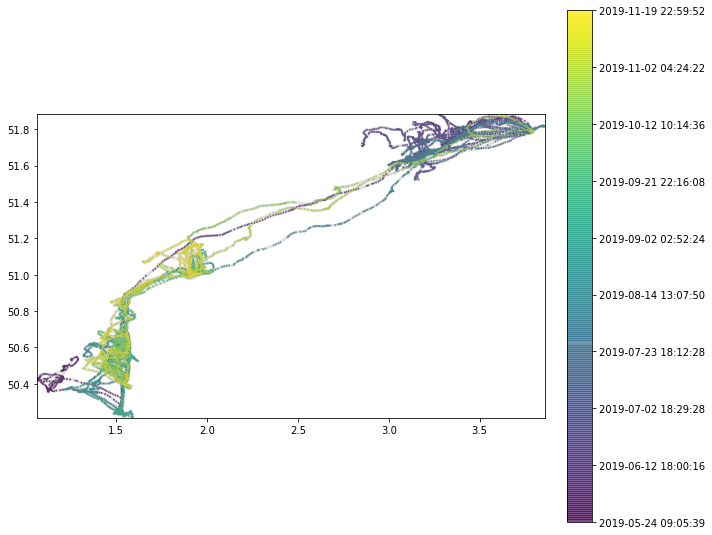

In [67]:
#import packages
import traja
%matplotlib inline
import mpld3
mpld3.enable_notebook()
# Converting to Traja DataFramme
trjG17 = traja.TrajaDataFrame(G17)
#get date time object
G17.time = pd.to_datetime(G17.time)
#Plot Trajectory
figG17 = G17.traja.plot(figsize=[10.,11.])

## Trajectory of  <font color=blue>Seal G20</font> 

C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWar

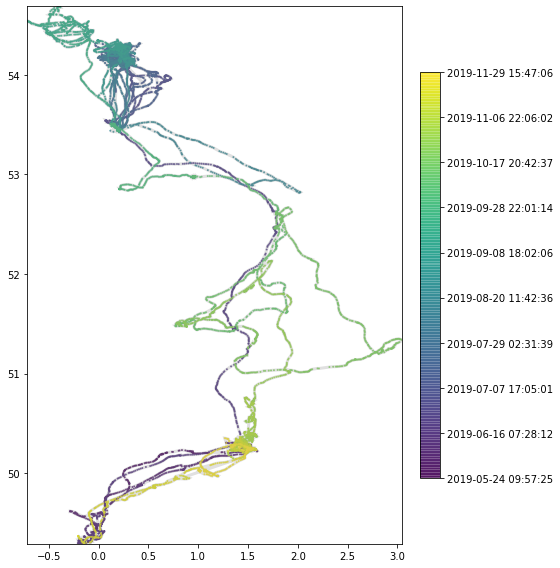

In [72]:
trjG20 = traja.TrajaDataFrame(G20)

G20.time = pd.to_datetime(G20.time)

figG20 = G20.traja.plot(figsize=[8.,8.])

## Trajectory of  <font color=blue>Seal S12</font> 

C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWar

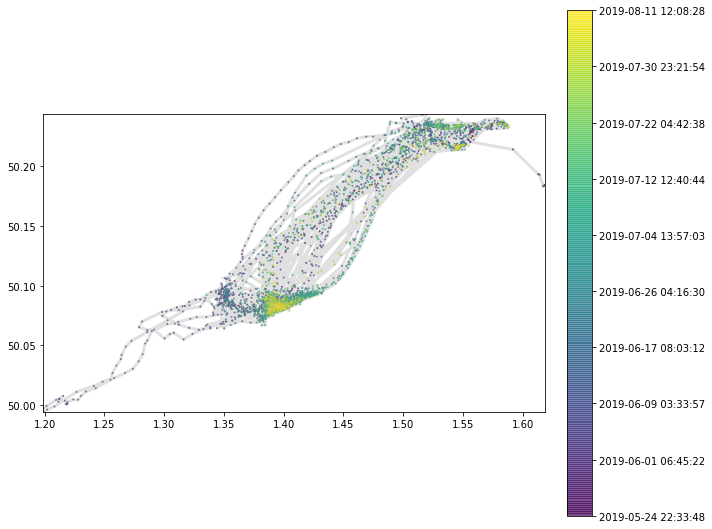

In [73]:
trjS12 = traja.TrajaDataFrame(S12)

S12.time = pd.to_datetime(S12.time)

figS12 = S12.traja.plot(figsize=[10.,10.])

## Trajectory of  <font color=blue>Seal S11</font> 

C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  return numpy.asscalar(obj)
C:\Users\aakom\anaconda3\lib\site-packages\mpld3\_display.py:138: DeprecationWar

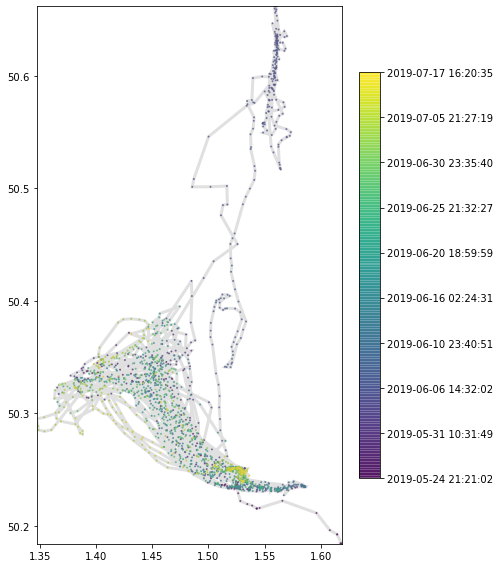

In [74]:
trjS11 = traja.TrajaDataFrame(S11)

S11.time = pd.to_datetime(S11.time)

figS11 = S11.traja.plot(figsize=[8.,8.])

This is the end of the First part of this Project. Part II will be done with R.

Thanks.

## References

[1] 	. D. McLean and V. M. Skowron , "trajr: An R package for Characterisation of Animal Trajectories," Ethology, pp. 124:440-448, 2018. 

[2] 	P. Turchin, "Fractal Analyses of Animal Movement: A Critique," Ecology, no. 77(7), pp. 2086-2090, 1996. 

[3] 	J. Shenk, " A Python Trajectory Analysis Library pypi.org," 2009. [Online]. Available: https://pypi.org/project/traja/. [Accessed 22 08 2020].

[4] 	B. V. Tobias B., V. A. Bart and I. B. Torstein , "Bidirectional UTM-WGS84 converter for python," 2012. [Online]. Available: https://github.com/Turbo87/utm. [Accessed 11 8 2020].

[5] 	S. Benhamou, "How to reliably estimate the tortuosity of an animal's path," Journal of Theoretical Biology, vol. 2, no. 229, pp. 209-220, 2004. 

[6] 	E. Batschelet, "Circular statistics in biology," ACADEMIC PRESS, p. 388, 1981. 

[7] 	P. Bovet and Benhamou, S., "Spatial analysis of animals' movements using a correlated random walk model," Journal of Theoretical Biology, vol. 4, no. 131, pp. 419-433, 1988. 

[8] 	Cheung, A., Zhang, S., Stricker, C. and Srinivasan, M. V., "Animal navigation: the difficulty of moving in a straight line," Biological Cybernetics, vol. 1, no. 97, pp. 47-61, 2007. 

[9] 	N. VO., " Improving accuracy and precision in estimating fractal dimension of animal," Acta Biotheor, vol. 1, no. 54, pp. 1-11, 2006. 

[10] 	J. McLean, "Package ‘trajr’: Animal Trajectory Analysis," 2019.

[11] 	Veronica D. and Erik D., "Fractal Analysis Can Explain Individual Variation in Dispersal Search Paths," Wiley, vol. 85, no. 5, pp. 1428-1438, 2004. 

[12] 	B. Mandelbrot, "How long is the coast of Britain? Statistical selfsimilarity and fractional dimension," Science, vol. 156, no. 3775, p. 636–638, 1967. 